In [85]:
# Uavsar_pytools imports
from uavsar_pytools.snow_depth_inversion import depth_from_phase, phase_from_depth

#import pandas
import pandas as pd

#import glob
import glob

# Other imports
from os.path import join

#import rioxarray
import rioxarray as rxa

#import hvplot
import hvplot.xarray

#import plotting library
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
isce_sat2/contributors/naheem/download_files/grmesa_27416_20003-028_20005-007_0011d_s01_L090_01_int_grd/grmesa_27416_20003-028_20005-007_0011d_s01_L090_01_int_grd.csv

In [22]:
#extract the start and end acquisition date for each `acsv in the director

df1 = pd.read_csv('/home/jovyan/isce_sat2/contributors/naheem/download_files/grmesa_27416_20003-028_20005-007_0011d_s01_L090_01_int_grd/grmesa_27416_20003-028_20005-007_0011d_s01_L090_01_int_grd.csv',
                     usecols = [ 'slant range unwrapped phase', 'start time of acquisition for pass 1', 'start time of acquisition for pass 2'])

df1

,slant range unwrapped phase,start time of acquisition for pass 1,start time of acquisition for pass 2
0,grmesa_27416_20003-028_20005-007_0011d_s01_L09...,1-Feb-2020 02:13:16 UTC,12-Feb-2020 16:47:20 UTC
1,&,&,&
2,file size 54574080 bytes,start time of acquisition for pass 1 ...,start time of acquisition for pass 2 ...


In [29]:
df = pd.DataFrame(columns=['scene_name', 'start_date', 'end_date'])

folder_list = glob.glob('/home/jovyan/isce_sat2/contributors/naheem/download_files/' + '*int_grd')

for i in range(len(folder_list)):
    df.loc[i, 'scene_name'] = folder_list[i].split('/')[-1]
    #read the csv file in the folder and get the start time for pass 1 and 2
    df.loc[i, 'start_date'] = (pd.read_csv(glob.glob(folder_list[i] + '/' + '*.csv')[0]).loc[0, 'start time of acquisition for pass 1'][:11])
    df.loc[i, 'end_date'] = (pd.read_csv(glob.glob(folder_list[i] + '/' + '*.csv')[0]).loc[0, 'start time of acquisition for pass 2'][:11])

In [30]:
df

,scene_name,start_date,end_date
0,grmesa_27416_21019-017_21021-005_0006d_s01_L09...,16-Mar-2021,22-Mar-2021
1,grmesa_27416_21016-002_21017-017_0007d_s01_L09...,3-Mar-2021,10-Mar-2021
2,grmesa_27416_20003-028_20008-004_0018d_s01_L09...,1-Feb-2020,19-Feb-2020
3,grmesa_27416_21017-017_21019-017_0006d_s01_L09...,10-Mar-2021,16-Mar-2021
4,grmesa_27416_20003-028_20013-004_0025d_s01_L09...,1-Feb-2020,26-Feb-2020
5,grmesa_27416_20013-004_20017-006_0015d_s01_L09...,26-Feb-2020,12-Mar-2020
6,grmesa_27416_20008-004_20013-004_0007d_s01_L09...,19-Feb-2020,26-Feb-2020
7,grmesa_27416_20003-028_20005-007_0011d_s01_L09...,1-Feb-2020,12-Feb-2020
8,grmesa_27416_21007-004_21010-002_0007d_s01_L09...,27-Jan-2021,3-Feb-2021
9,grmesa_27416_20005-007_20008-004_0007d_s01_L09...,12-Feb-2020,19-Feb-2020


In [43]:
df_sort = df.sort_values('start_date')
df_sort

,scene_name,start_date,end_date
2,grmesa_27416_20003-028_20008-004_0018d_s01_L09...,1-Feb-2020,19-Feb-2020
4,grmesa_27416_20003-028_20013-004_0025d_s01_L09...,1-Feb-2020,26-Feb-2020
7,grmesa_27416_20003-028_20005-007_0011d_s01_L09...,1-Feb-2020,12-Feb-2020
11,grmesa_27416_20003-028_20017-006_0040d_s01_L09...,1-Feb-2020,12-Mar-2020
12,grmesa_27416_21011-010_21016-002_0021d_s01_L09...,10-Feb-2021,3-Mar-2021
3,grmesa_27416_21017-017_21019-017_0006d_s01_L09...,10-Mar-2021,16-Mar-2021
9,grmesa_27416_20005-007_20008-004_0007d_s01_L09...,12-Feb-2020,19-Feb-2020
0,grmesa_27416_21019-017_21021-005_0006d_s01_L09...,16-Mar-2021,22-Mar-2021
6,grmesa_27416_20008-004_20013-004_0007d_s01_L09...,19-Feb-2020,26-Feb-2020
5,grmesa_27416_20013-004_20017-006_0015d_s01_L09...,26-Feb-2020,12-Mar-2020


In [55]:
for i in df_sort['scene_name'].to_list():
    print(i)

grmesa_27416_20003-028_20008-004_0018d_s01_L090_01_int_grd
grmesa_27416_20003-028_20013-004_0025d_s01_L090_01_int_grd
grmesa_27416_20003-028_20005-007_0011d_s01_L090_01_int_grd
grmesa_27416_20003-028_20017-006_0040d_s01_L090_01_int_grd
grmesa_27416_21011-010_21016-002_0021d_s01_L090_01_int_grd
grmesa_27416_21017-017_21019-017_0006d_s01_L090_01_int_grd
grmesa_27416_20005-007_20008-004_0007d_s01_L090_01_int_grd
grmesa_27416_21019-017_21021-005_0006d_s01_L090_01_int_grd
grmesa_27416_20008-004_20013-004_0007d_s01_L090_01_int_grd
grmesa_27416_20013-004_20017-006_0015d_s01_L090_01_int_grd
grmesa_27416_21007-004_21010-002_0007d_s01_L090_01_int_grd
grmesa_27416_21010-002_21011-010_0007d_s01_L090_01_int_grd
grmesa_27416_21016-002_21017-017_0007d_s01_L090_01_int_grd


In [ ]:
sd_change = depth_from_phase(unw, inc, density = mean_new_density)

# Open up our two rasters (unwrapped phase and incidence angle)
unw = rxa.open_rasterio(join(data_dir, f'unw.tif'))
inc = rxa.open_rasterio(join(data_dir, f'inc.tif'))

# This uses the pytool's function to directly give you snow depth change
# feel free to rerun with this to check your results
# https://github.com/SnowEx/uavsar_pytools/blob/main/uavsar_pytools/snow_depth_inversion.py
sd_change = depth_from_phase(unw, inc, density = mean_new_density)

# convert to centimeters from meters
sd_change = sd_change*100

In [54]:
unw = rxa.open_rasterio('/home/jovyan/isce_sat2/contributors/naheem/download_files/grmesa_27416_20005-007_20008-004_0007d_s01_L090_01_int_grd/grmesa_27416_20005-007_20008-004_0007d_s01_L090VV_01.unw.grd.tiff')
inc = rxa.open_rasterio('/home/jovyan/isce_sat2/contributors/naheem/download_files/grmesa_27416_20017_006_200312_L090_CX_01.inc.tiff')

sd_02_12_02_19 = depth_from_phase(unw, inc, density = 200)
sd_02_12_02_19.rio.to_raster('../results/sd_02_12_02_19.tif')

No permittivity data provided -- calculating permittivity from snow density using method guneriussen2001.


In [52]:
isce_sat2/contributors/naheem/download_files/grmesa_27416_20008-004_20013-004_0007d_s01_L090_01_int_grd/grmesa_27416_20008-004_20013-004_0007d_s01_L090VV_01.unw.grd.tiff

'/home/jovyan/isce_sat2/contributors/naheem/notebook'

In [56]:
unw = rxa.open_rasterio('../download_files/grmesa_27416_20008-004_20013-004_0007d_s01_L090_01_int_grd/grmesa_27416_20008-004_20013-004_0007d_s01_L090VV_01.unw.grd.tiff')
inc = rxa.open_rasterio('../download_files/grmesa_27416_20017_006_200312_L090_CX_01.inc.tiff')

sd_02_19_02_26 = depth_from_phase(unw, inc, density = 200)
sd_02_19_02_26.rio.to_raster('../results/sd_02_19_02_26.tif')

No permittivity data provided -- calculating permittivity from snow density using method guneriussen2001.


In [ ]:
unw = rxa.open_rasterio('../download_files/grmesa_27416_20013-004_20017-006_0015d_s01_L090_01_int_grd/grmesa_27416_20013-004_20017-006_0015d_s01_L090VV_01.unw.grd.tiff')
inc = rxa.open_rasterio('../download_files/grmesa_27416_20017_006_200312_L090_CX_01.inc.tiff')

sd_02_26_03_12 = depth_from_phase(unw, inc, density = 200)
sd_02_26_03_12.rio.to_raster('../results/sd_02_26_03_12.tif')

In [ ]:
unw = rxa.open_rasterio('../download_files/grmesa_27416_20013-004_20017-006_0015d_s01_L090_01_int_grd/grmesa_27416_20013-004_20017-006_0015d_s01_L090VV_01.unw.grd.tiff')
inc = rxa.open_rasterio('../download_files/grmesa_27416_20017_006_200312_L090_CX_01.inc.tiff')

sd_02_26_03_12 = depth_from_phase(unw, inc, density = 200)
sd_02_26_03_12.rio.to_raster('../results/sd_02_26_03_12.tif')

No permittivity data provided -- calculating permittivity from snow density using method guneriussen2001.


In [60]:
sd_02_26_03_12.hvplot.image(x= 'x', y = 'y', rasterize = True, cmap = 'viridis', height = 500)

:DynamicMap   [band]
   :Image   [x,y]   (value)

In [70]:
!gdalinfo '../results/sd_02_26_03_12.tif'

Driver: GTiff/GeoTIFF
Files: ../results/sd_02_26_03_12.tif
Size is 6867, 3332
Coordinate System is:
GEOGCRS["WGS 84",
    DATUM["World Geodetic System 1984",
        ELLIPSOID["WGS 84",6378137,298.257223563,
            LENGTHUNIT["metre",1]]],
    PRIMEM["Greenwich",0,
        ANGLEUNIT["degree",0.0174532925199433]],
    CS[ellipsoidal,2],
        AXIS["geodetic latitude (Lat)",north,
            ORDER[1],
            ANGLEUNIT["degree",0.0174532925199433]],
        AXIS["geodetic longitude (Lon)",east,
            ORDER[2],
            ANGLEUNIT["degree",0.0174532925199433]],
    ID["EPSG",4326]]
Data axis to CRS axis mapping: 2,1
Origin = (-108.373510798164872,39.179807772104475)
Pixel Size = (0.000072116329741,-0.000069504208946)
Metadata:
  AREA_OR_POINT=Area
Image Structure Metadata:
  INTERLEAVE=BAND
Corner Coordinates:
Upper Left  (-108.3735108,  39.1798078) (108d22'24.64"W, 39d10'47.31"N)
Lower Left  (-108.3735108,  38.9482197) (108d22'24.64"W, 38d56'53.59"N)
Upper Right (-107

In [67]:
#reproject ASO snow depth to match
ASO_3m = rxa.open_rasterio('../download_files/ASO_GrandMesa_2020Feb13_snowdepth_3m.tif')

ASO_3m.hvplot.image(x= 'x', y = 'y', rasterize = True, cmap = 'viridis', height = 500)


:DynamicMap   [band]
   :Image   [x,y]   (value)

In [73]:
ASO_3M_reproj = ASO_3m.rio.reproject_match(sd_02_19_02_26)
ASO_3M_reproj = ASO_3M_reproj.where(ASO_3M_reproj < 3)
ASO_3M_reproj.hvplot.image(x= 'x', y = 'y', rasterize = True, cmap = 'viridis', height = 500)

:DynamicMap   [band]
   :Image   [x,y]   (value)

In [76]:
SD_02_19 = ASO_3M_reproj + sd_02_12_02_19
SD_02_19.rio.to_raster('../results/SD_02_19.tif')

In [77]:
SD_02_26 = SD_02_19 + sd_02_19_02_26
SD_02_26.rio.to_raster('../results/SD_02_26.tif')

In [78]:
SD_03_12 = SD_02_26 + sd_02_26_03_12
SD_03_12.rio.to_raster('../results/SD_03_12.tif')

In [79]:
SD_03_12.hvplot.image(x= 'x', y = 'y', rasterize = True, cmap = 'viridis', height = 500)

:DynamicMap   [band]
   :Image   [x,y]   (value)

In [83]:
(SD_03_12.where(SD_03_12 > 0.5)).hvplot.image(x= 'x', y = 'y', rasterize = True, cmap = 'viridis', height = 500)


:DynamicMap   [band]
   :Image   [x,y]   (value)

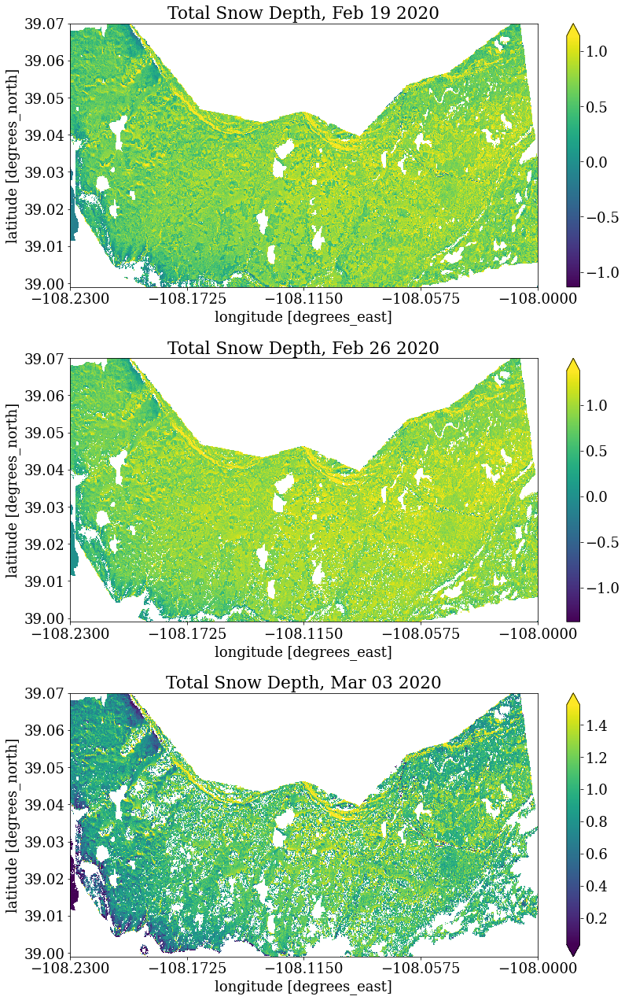

In [97]:
# Set font size and font family
plt.rcParams.update({'font.size': 18})
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']

#create fig and axes elements
fig, axs = plt.subplots(nrows = 3, figsize=(12, 18))

#plot the data
SD_02_19.plot(ax = axs[0], cmap = 'viridis', robust = True) 
SD_02_26.plot(ax = axs[1], cmap = 'viridis', robust = True)
SD_03_12.plot(ax = axs[2], cmap = 'viridis', robust = True)

#Set the title
# fig.suptitle('Cameron Study Area', fontsize = 20)

#set the axes title and tick locators
axs[0].set_title('Total Snow Depth, Feb 19 2020')
axs[0].xaxis.set_major_locator(plt.LinearLocator(5))
axs[1].set_title('Total Snow Depth, Feb 26 2020')
axs[1].xaxis.set_major_locator(plt.LinearLocator(5))
axs[2].set_title('Total Snow Depth, Mar 03 2020')
axs[2].xaxis.set_major_locator(plt.LinearLocator(5))
for a in axs:
    a.set_xlim(-108.23,-108)
    a.set_ylim(38.999,39.07)
plt.tight_layout()
plt.show()

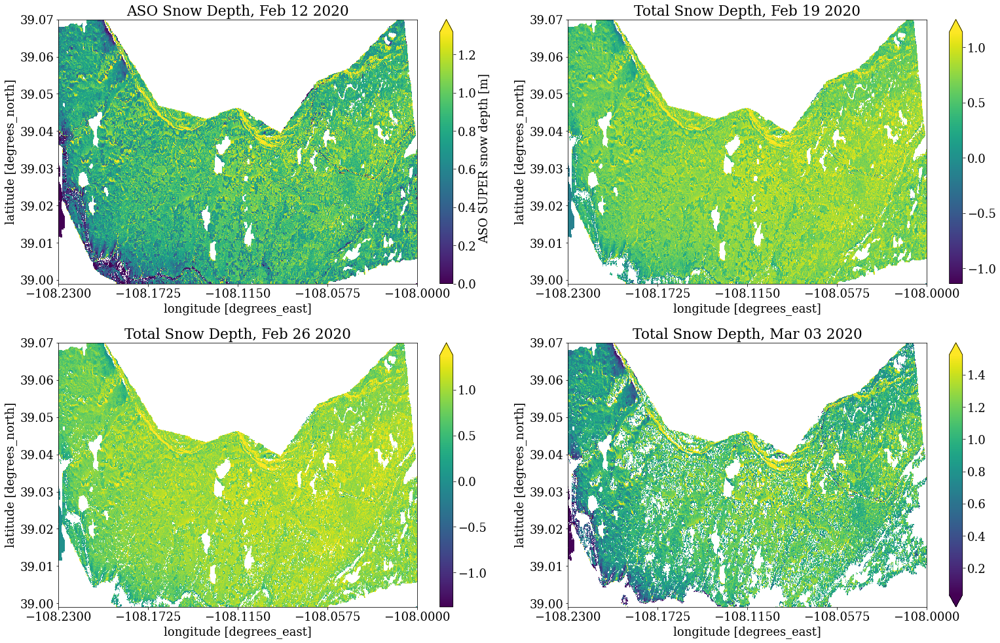

In [102]:
# Set font size and font family
plt.rcParams.update({'font.size': 18})
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']

#create fig and axes elements
fig, axs = plt.subplots(nrows = 2, ncols = 2, figsize=(22, 14))

#plot the data
ASO_3M_reproj.plot(ax = axs[0,0], cmap = 'viridis', robust = True) 
SD_02_19.plot(ax = axs[0, 1], cmap = 'viridis', robust = True) 
SD_02_26.plot(ax = axs[1,0], cmap = 'viridis', robust = True)
SD_03_12.plot(ax = axs[1,1], cmap = 'viridis', robust = True)

#Set the title
# fig.suptitle('Cameron Study Area', fontsize = 20)

#set the axes title and tick locators
axs[0, 0].set_title('ASO Snow Depth, Feb 12 2020')
axs[0, 1].set_title('Total Snow Depth, Feb 19 2020')
axs[1, 0].set_title('Total Snow Depth, Feb 26 2020')
axs[1, 1].set_title('Total Snow Depth, Mar 03 2020')

for b in axs:
    for a in b:
        a.set_xlim(-108.23,-108)
        a.set_ylim(38.999,39.07)
        a.xaxis.set_major_locator(plt.LinearLocator(5))
plt.tight_layout()
plt.savefig('../results/SD_inversion.jpeg')
plt.show()